In [6]:
!rm -rf /content/AGRIFARM-9


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="s4FZabiIIE2JRuSa8MFn")
project = rf.workspace("krishi-oz05i").project("agrifarm-3zwm0")
version = project.version(9)
dataset = version.download("png-mask-semantic")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 81.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 130.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to AGRIFARM-9 in png-mask-semantic:: 100%|██████████| 552/552 [00:00<00:00, 2650.13it/s]


In [3]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image as PilImage
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

In [4]:
torch.manual_seed(42)

In [5]:
# device
device = torch.device("cuda" if torch.cuda.is_available else "cpu")
print("device:",device)

device: cuda


In [6]:
import os
import shutil

# Original folder containing mixed files
src_dir = "/content/AGRIFARM-9/train"

# Destination folders
img_dest = "/content/train/images"
mask_dest = "/content/train/masks"

# Create destination folders if they don't exist
os.makedirs(img_dest, exist_ok=True)
os.makedirs(mask_dest, exist_ok=True)

# Move files
for f in os.listdir(src_dir):
    src_path = os.path.join(src_dir, f)
    if f.endswith(".jpg"):
        shutil.copy(src_path, os.path.join(img_dest, f))
    elif f.endswith("_mask.png"):
        shutil.copy(src_path, os.path.join(mask_dest, f))

print(f"✅ All images moved to {img_dest}")
print(f"✅ All masks moved to {mask_dest}")


✅ All images moved to /content/train/images
✅ All masks moved to /content/train/masks


In [7]:
import os
import shutil

# Original folder containing mixed files
src_dir = "/content/AGRIFARM-9/valid"

# Destination folders
img_dest = "/content/valid/images"
mask_dest = "/content/valid/masks"

# Create destination folders if they don't exist
os.makedirs(img_dest, exist_ok=True)
os.makedirs(mask_dest, exist_ok=True)

# Move files
for f in os.listdir(src_dir):
    src_path = os.path.join(src_dir, f)
    if f.endswith(".jpg"):
        shutil.copy(src_path, os.path.join(img_dest, f))
    elif f.endswith("_mask.png"):
        shutil.copy(src_path, os.path.join(mask_dest, f))

print(f"✅ All images moved to {img_dest}")
print(f"✅ All masks moved to {mask_dest}")


✅ All images moved to /content/valid/images
✅ All masks moved to /content/valid/masks


In [8]:
with open("/content/AGRIFARM-9/valid/_classes.csv", "r") as f:
    for line in f:
        print(line.strip())  # remove trailing newline


Pixel Value, Class
0, background
1, Barrenland
2, Bush
3, Farmland
4, Sand
5, Tree
6, edgecase


In [9]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset

class DroneDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None, ignore_classes=[0, 6], ignore_index=-1):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.ignore_classes = ignore_classes
        self.ignore_index = ignore_index

        # List & sort for correct pairing
        self.images = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(("png","jpg","jpeg"))])
        self.masks  = sorted([f for f in os.listdir(mask_dir) if f.lower().endswith(("png","jpg","jpeg"))])

        # Check length mismatch
        if len(self.images) != len(self.masks):
            raise ValueError(
                f"Mismatch: {len(self.images)} images vs {len(self.masks)} masks.\n"
                f"Check filenames — they must match (e.g., image_001.png & mask_001.png)"
            )

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):

        # --- Load image ---
        img_path = os.path.join(self.image_dir, self.images[index])
        image = cv2.imread(img_path)
        if image is None:
            raise ValueError(f"Failed to load image: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # --- Load mask ---
        mask_path = os.path.join(self.mask_dir, self.masks[index])
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

        if mask is None:
            raise ValueError(f"Failed to load mask: {mask_path}")

        # If mask is RGB (H, W, 3) → convert to (H, W)
        if len(mask.shape) == 3:
            mask = mask[:, :, 0]

        # --- Apply ignoring unwanted classes (0 = background, 6 = edgecase) ---
        mask = mask.astype(np.int32)
        for cls in self.ignore_classes:
            mask[mask == cls] = self.ignore_index

        # --- Albumentations transform ---
        if self.transform is not None:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        # --- Convert mask to LongTensor for CE Loss ---
        mask = torch.as_tensor(mask, dtype=torch.long)

        return image, mask


In [10]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.RandomCrop(height=512, width=512),

    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),

    # Strong augmentations for satellite images
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=0.3),

    # Color augmentation
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.3),

    # Normalize for VGG16 encoder
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])
val_transform = A.Compose([
    A.CenterCrop(height=512, width=512),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])



ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.


In [11]:
TRAIN_IMG_DIR = '/content/train/images/'
TRAIN_MASK_DIR = '/content/train/masks/'
VAL_IMG_DIR = '/content/valid/images/'
VAL_MASK_DIR = '/content/valid/masks/'

In [12]:
from torch.utils.data import DataLoader

# 1. Initialize Datasets
train_dataset = DroneDataset(
    image_dir=TRAIN_IMG_DIR,
    mask_dir=TRAIN_MASK_DIR,
    transform=train_transform
)

val_dataset = DroneDataset(
    image_dir=VAL_IMG_DIR,
    mask_dir=VAL_MASK_DIR,
    transform=val_transform
)

# 2. Create Dataloaders
BATCH_SIZE = 4 # Adjust based on your GPU VRAM (try 4 or 8 for 512x512)
NUM_WORKERS = 2 # Number of CPU threads for data loading

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,          # Shuffle training data
    num_workers=NUM_WORKERS,
    pin_memory=True        # Faster transfer to GPU
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,         # No need to shuffle validation
    num_workers=NUM_WORKERS,
    pin_memory=True
)

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Final class names USED IN MASK
CLASS_NAMES = {
    -1: "ignore",
     0: "background",
     1: "Barrenland",
     2: "Bush",
     3: "Farmland",
     4: "Sand",
     5: "Tree",
     6: "edgecase"
}

# ImageNet normalization used during training
MEAN = np.array([0.485, 0.456, 0.406])
STD  = np.array([0.229, 0.224, 0.225])

def visualize_train_batch(loader, num_images=4):
    images, masks = next(iter(loader))   # Load 1 batch

    num_images = min(images.size(0), num_images)

    plt.figure(figsize=(16, 5 * num_images))

    for idx in range(num_images):

        # -------------------
        # PROCESS IMAGE
        # -------------------
        img = images[idx].permute(1, 2, 0).cpu().numpy()  # (C,H,W)->(H,W,C)
        img = (img * STD) + MEAN                          # unnormalize
        img = np.clip(img, 0, 1)

        # -------------------
        # PROCESS MASK
        # -------------------
        mask = masks[idx].cpu().numpy()   # (H, W)

        # Valid class range = [-1, 5]
        # But for visualization, we want -1 to show as a fixed color.
        # We shift ignore(-1) → 0 visually but mark it separately to display correctly.
        vis_mask = mask.copy()
        vis_mask[vis_mask == -1] = 7  # Put ignore pixels at index 7 to visualize separately

        # -------------------
        # PLOT: Original Image
        # -------------------
        plt.subplot(num_images, 3, idx * 3 + 1)
        plt.imshow(img)
        plt.title(f"Image {idx}")
        plt.axis("off")

        # -------------------
        # PLOT: Ground Truth Mask
        # -------------------
        plt.subplot(num_images, 3, idx * 3 + 2)
        plt.imshow(vis_mask, cmap="tab10", interpolation='nearest', vmin=0, vmax=7)
        plt.title(f"Mask {idx}")
        plt.axis("off")

        # -------------------
        # PLOT: Overlay
        # -------------------
        plt.subplot(num_images, 3, idx * 3 + 3)
        plt.imshow(img)
        plt.imshow(vis_mask, cmap="tab10", alpha=0.4, interpolation='nearest', vmin=0, vmax=7)
        plt.title(f"Overlay {idx}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

    # ---- Print class distribution ----
    unique_vals = np.unique(masks.cpu().numpy())
    print(f"Unique pixel values in this batch mask: {unique_vals}")
    print("Meaning:")
    for val in unique_vals:
        print(f"  {val}: {CLASS_NAMES.get(int(val), 'Unknown')}")


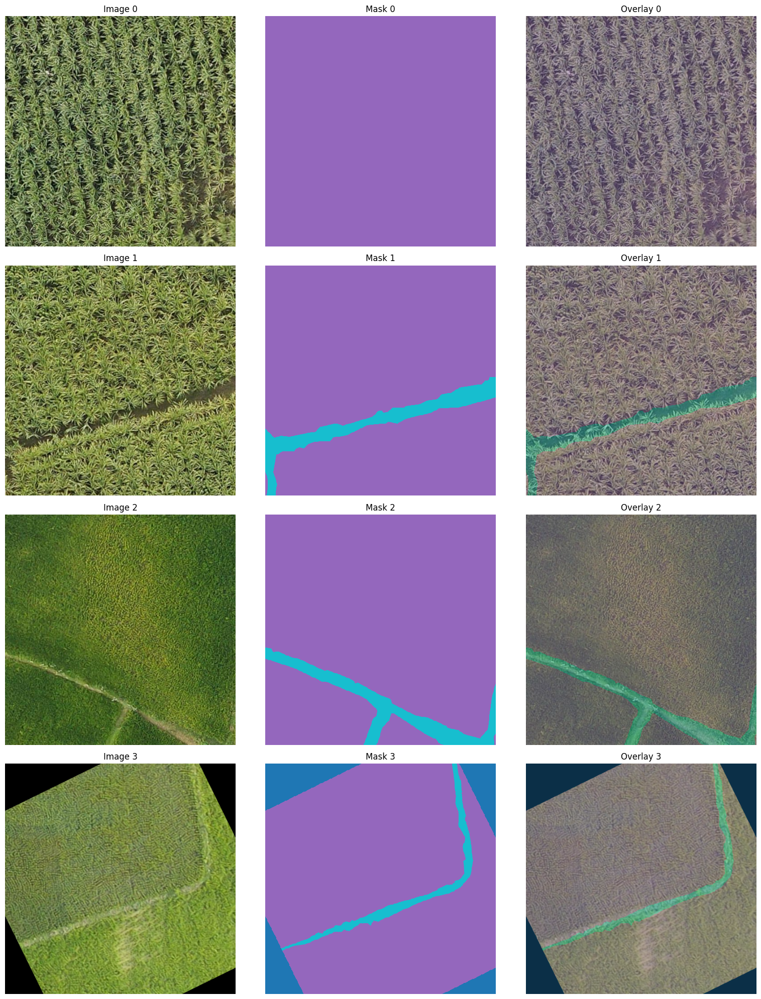

Unique pixel values in this batch mask: [-1  0  3]
Meaning:
  -1: ignore
  0: background
  3: Farmland


In [9]:
visualize_train_batch(train_loader)

In [14]:
import torch
import torch.nn as nn
import torchvision.models as models

class ConvBlock(nn.Module):
    """
    Helper module that corresponds to the 'conv_block' function in your Keras code.
    Structure: Conv -> BN -> ReLU -> Conv -> BN -> ReLU
    """
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class DecoderBlock(nn.Module):
    """
    Helper module that corresponds to the 'decoder_block' function.
    Structure: UpSample (ConvTranspose) -> Concatenate -> ConvBlock
    """
    def __init__(self, in_channels, skip_channels, out_channels):
        super(DecoderBlock, self).__init__()
        # Upsampling: input channels -> out_channels
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

        # The ConvBlock takes the concatenated input.
        # Input = out_channels (from upsample) + skip_channels (from encoder)
        self.conv = ConvBlock(out_channels + skip_channels, out_channels)

    def forward(self, x, skip_features):
        x = self.up(x)

        # Concatenate along channel dimension (dim=1)
        # Note: If input sizes don't match exactly due to padding issues in VGG,
        # you might need resizing here, but for 512x512 or 1024x1024 it matches perfectly.
        x = torch.cat([x, skip_features], dim=1)

        x = self.conv(x)
        return x

class VGG16UNet(nn.Module):
    def __init__(self, num_classes):
        super(VGG16UNet, self).__init__()

        # --- ENCODER ---
        # Load VGG16 with ImageNet weights
        vgg16 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)
        features = vgg16.features

        # Extract specific layers for Skip Connections
        # VGG16 Structure indices:
        # Block 1: [0:4] (Output: 64 ch) -> MaxPool at 4
        # Block 2: [5:9] (Output: 128 ch) -> MaxPool at 9
        # Block 3: [10:16] (Output: 256 ch) -> MaxPool at 16
        # Block 4: [17:23] (Output: 512 ch) -> MaxPool at 23
        # Block 5: [24:30] (Output: 512 ch) -> MaxPool at 30

        self.enc1 = features[0:4]   # s1
        self.pool1 = features[4]

        self.enc2 = features[5:9]   # s2
        self.pool2 = features[9]

        self.enc3 = features[10:16] # s3
        self.pool3 = features[16]

        self.enc4 = features[17:23] # s4
        self.pool4 = features[23]

        self.bridge = features[24:30] # b1

        # --- DECODER ---
        # Arguments: (Input Channels, Skip Channels, Output Channels)
        self.d1 = DecoderBlock(512, 512, 512)
        self.d2 = DecoderBlock(512, 256, 256)
        self.d3 = DecoderBlock(256, 128, 128)
        self.d4 = DecoderBlock(128, 64, 64)

        # --- OUTPUT ---
        # 1x1 Convolution to map to num_classes
        # Note: We do NOT use Softmax here because PyTorch's CrossEntropyLoss includes it.
        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        # --- Encoder Pass ---
        s1 = self.enc1(x)          # Block 1 Output
        p1 = self.pool1(s1)

        s2 = self.enc2(p1)         # Block 2 Output
        p2 = self.pool2(s2)

        s3 = self.enc3(p2)         # Block 3 Output
        p3 = self.pool3(s3)

        s4 = self.enc4(p3)         # Block 4 Output
        p4 = self.pool4(s4)

        b1 = self.bridge(p4)       # Bridge Output

        # --- Decoder Pass ---
        d1 = self.d1(b1, s4)       # 512 + 512 -> 512
        d2 = self.d2(d1, s3)       # 256 + 256 -> 256
        d3 = self.d3(d2, s2)       # 128 + 128 -> 128
        d4 = self.d4(d3, s1)       # 64 + 64 -> 64

        outputs = self.final_conv(d4)

        return outputs

# --- Usage Example ---
# if __name__ == "__main__":
#     # 1. Constants
#     NUM_CLASSES = 7 # Your 7 classes (0-6)
#     IMG_HEIGHT = 512
#     IMG_WIDTH = 512

#     # 2. Instantiate Model
#     # Move to GPU if available
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     model = VGG16UNet(num_classes=NUM_CLASSES).to(device)

#     # 3. Summary (Optional, requires torchinfo)
#     try:
#         from torchinfo import summary
#         summary(model, input_size=(1, 3, IMG_HEIGHT, IMG_WIDTH))
#     except ImportError:
#         print("Install torchinfo for model summary: pip install torchinfo")
#         print(model)

#     # 4. Fake Input Check
#     dummy_input = torch.randn(1, 3, IMG_HEIGHT, IMG_WIDTH).to(device)
#     output = model(dummy_input)
#     print(f"\nInput Shape: {dummy_input.shape}")
#     print(f"Output Shape: {output.shape}") # Should be [1, 7, 512, 512]

In [15]:
model = VGG16UNet(num_classes=7)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:02<00:00, 197MB/s]


In [16]:
model = model.to(device)

In [21]:
# model
# double conv
class DoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size = 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)

In [22]:
## U-NET
class UNET(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64,128,256,512]):
        super().__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)

        # down part of U-Net
        for feature in features:
            self.downs.append(DoubleConv(in_channels,feature))
            in_channels = feature

        # up part of U-Net
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2,feature,kernel_size = 2 , stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        # bottleneck
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size = 1 )

    def forward(self, x):
        skip_connections = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection  = skip_connections[idx//2]

            if x.shape != skip_connection.shape:
                x = TF.resize(x, size = skip_connection.shape[2:])
            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)


In [23]:
model = UNET(in_channels=3, out_channels=7)

In [17]:
import copy

class EarlyStopping:
    def __init__(self, patience = 5 , min_delta = 0.001 , restore_best_weights = True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_val_loss = None
        self.best_dice_loss = None
        self.counter = 0
        self.status = ""

    def __call__(self, model, val_loss, dice_loss ):
        if self.best_val_loss is None:
            self.best_val_loss = val_loss
            self.best_dice_loss = dice_loss
            self.best_model = copy.deepcopy(model.state_dict())
        elif self.best_val_loss - val_loss >= self.min_delta and dice_loss > self.best_dice_loss + self.min_delta:
            self.best_model = copy.deepcopy(model.state_dict())
            self.best_val_loss = val_loss
            self.best_dice_loss = dice_loss
            self.counter = 0
            self.status = f"Improvement found, counter reset to {self.counter}"
        else:
            self.counter += 1
            self.status = f"No improvement in the last {self.counter} epochs"
            if self.counter >= self.patience:
                self.status = f"Early Stopping triggered after {self.counter} epochs"
                if self.restore_best_weights:
                    model.load_state_dict(self.best_model)
                return True
        return False

In [18]:
# training loop
def train_one_epoch(model, train_loader, criterion, optimizer, device ):
    model.train()
    running_loss = 0.0
    num_train_samples = 0.0

    for images, labels in tqdm(train_loader, desc="Training"):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        # forward pass
        outputs = model(images)

        # loss
        loss = criterion(outputs, labels)

        # gradient
        loss.backward()

        # update
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        num_train_samples += images.size(0)
    average_train_loss = running_loss / num_train_samples
    return average_train_loss

In [19]:
def validate_one_epoch(model, val_loader, optimizer , criterion, dice_coeff, device):
    model.eval()
    running_val_loss = 0.0
    running_dice_score = 0.0
    num_val_samples = 0.0

    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc="validate"):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)

            loss = criterion(outputs, masks)
            dice_score = dice_coeff(outputs, masks)

            running_val_loss += loss.item() * images.size(0)
            running_dice_score += dice_score.item() * images.size(0)
            num_val_samples += images.size(0)

        avg_val_loss = running_val_loss / num_val_samples
        avg_dice_score = running_dice_score / num_val_samples

        return avg_val_loss, avg_dice_score


In [20]:
from tqdm import tqdm
def train_model(model , train_loader , val_loader, criterion, optimizer, dice_coeff, device, num_epochs, patience = 5):
    train_losses = []
    val_losses = []
    dice_scores = []

    earlyStopping = EarlyStopping()

    for epoch in tqdm(range(num_epochs), desc ="epochs"):
        train_loss = train_one_epoch(model, train_loader, criterion, optimizer, device)
        train_losses.append(train_loss)

        val_loss, dice_score = validate_one_epoch(model, val_loader, optimizer, criterion, dice_coeff, device)
        val_losses.append(val_loss)
        dice_scores.append(dice_score)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Dice Score: {dice_score:.4f}")

        # check early stopping
        if(earlyStopping(model, val_loss, dice_score)):
            break
    return train_losses, val_losses, dice_score


In [21]:
import torch.optim as optim

learning_rate = 0.0001
num_epochs = 50
criterion = nn.CrossEntropyLoss(ignore_index=-1)
model = model.to(device)
optimizer = optim.Adam(model.parameters(), lr = learning_rate)

In [22]:
import torch
import torch.nn.functional as F

def multiclass_dice(preds, targets, num_classes=7, epsilon=1e-6):
    """
    Compute Dice score for multi-class segmentation ignoring -1 labels.

    preds: [B, C, H, W] logits from model
    targets: [B, H, W] ground truth labels with -1 as ignore
    num_classes: total number of classes (including background if any)
    """
    # Apply softmax to get probabilities
    preds = F.softmax(preds, dim=1)

    # Create mask for valid pixels (ignore -1)
    mask = (targets != -1)  # True for valid pixels
    valid_targets = targets.clone()
    valid_targets[~mask] = 0  # temporarily set ignored pixels to 0

    # Convert to one-hot: [B, H, W] -> [B, C, H, W]
    targets_onehot = F.one_hot(valid_targets, num_classes=num_classes)  # [B, H, W, C]
    targets_onehot = targets_onehot.permute(0, 3, 1, 2).float()          # [B, C, H, W]

    # Mask out invalid pixels in both preds and targets
    preds = preds * mask.unsqueeze(1)
    targets_onehot = targets_onehot * mask.unsqueeze(1)

    # Compute Dice per class
    dims = (0, 2, 3)  # sum over batch, H, W
    intersection = torch.sum(preds * targets_onehot, dims)
    cardinality = torch.sum(preds + targets_onehot, dims)
    dice_per_class = (2.0 * intersection + epsilon) / (cardinality + epsilon)

    # Return mean Dice across classes
    return dice_per_class.mean()


In [23]:
train_losses, val_losses, dice_score = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    criterion=criterion,
    num_epochs=num_epochs,
    dice_coeff = multiclass_dice,
    device=device,
    patience=10
)


Training: 100%|██████████| 65/65 [00:56<00:00,  1.15it/s]

epochs:   2%|▏         | 1/50 [00:58<47:38, 58.34s/it]

Epoch [1/50], Train Loss: 1.5676, Val Loss: 1.2169, Dice Score: 0.1418



Training: 100%|██████████| 65/65 [00:57<00:00,  1.12it/s]

epochs:   4%|▍         | 2/50 [01:57<47:08, 58.93s/it]

Epoch [2/50], Train Loss: 1.2465, Val Loss: 0.8931, Dice Score: 0.1810



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:   6%|▌         | 3/50 [02:58<46:58, 59.96s/it]

Epoch [3/50], Train Loss: 1.0748, Val Loss: 0.8936, Dice Score: 0.1823



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:   8%|▊         | 4/50 [03:59<46:18, 60.39s/it]

Epoch [4/50], Train Loss: 1.0516, Val Loss: 0.8303, Dice Score: 0.1971



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  10%|█         | 5/50 [05:00<45:27, 60.60s/it]

Epoch [5/50], Train Loss: 0.9754, Val Loss: 1.1417, Dice Score: 0.1585



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  12%|█▏        | 6/50 [06:01<44:32, 60.74s/it]

Epoch [6/50], Train Loss: 0.9627, Val Loss: 0.9411, Dice Score: 0.1830



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  14%|█▍        | 7/50 [07:02<43:36, 60.85s/it]

Epoch [7/50], Train Loss: 0.9975, Val Loss: 0.6754, Dice Score: 0.2105



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  16%|█▌        | 8/50 [08:04<42:38, 60.91s/it]

Epoch [8/50], Train Loss: 0.9278, Val Loss: 0.6545, Dice Score: 0.2136



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  18%|█▊        | 9/50 [09:05<41:39, 60.97s/it]

Epoch [9/50], Train Loss: 0.8828, Val Loss: 0.6552, Dice Score: 0.2140



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  20%|██        | 10/50 [10:05<40:37, 60.93s/it]

Epoch [10/50], Train Loss: 0.8572, Val Loss: 0.6201, Dice Score: 0.2149



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  22%|██▏       | 11/50 [11:07<39:43, 61.11s/it]

Epoch [11/50], Train Loss: 0.8028, Val Loss: 0.5391, Dice Score: 0.2319



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  24%|██▍       | 12/50 [12:08<38:40, 61.07s/it]

Epoch [12/50], Train Loss: 0.7671, Val Loss: 0.6972, Dice Score: 0.2111



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  26%|██▌       | 13/50 [13:09<37:40, 61.08s/it]

Epoch [13/50], Train Loss: 0.7171, Val Loss: 0.6112, Dice Score: 0.2239



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  28%|██▊       | 14/50 [14:10<36:36, 61.01s/it]

Epoch [14/50], Train Loss: 0.7753, Val Loss: 0.5365, Dice Score: 0.2252



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  30%|███       | 15/50 [15:11<35:36, 61.03s/it]

Epoch [15/50], Train Loss: 0.7377, Val Loss: 0.5198, Dice Score: 0.2323



Training: 100%|██████████| 65/65 [00:59<00:00,  1.09it/s]

epochs:  30%|███       | 15/50 [16:12<37:49, 64.85s/it]

Epoch [16/50], Train Loss: 0.7290, Val Loss: 0.5618, Dice Score: 0.2285


`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


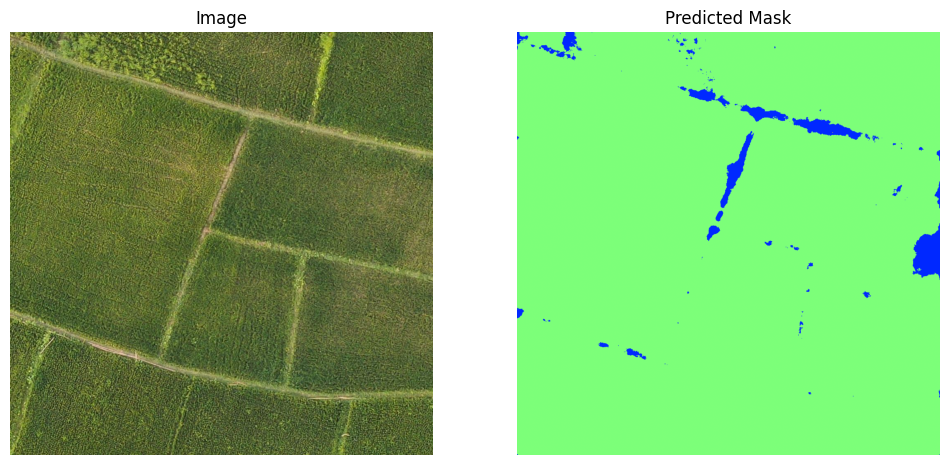

In [24]:
import torch
import numpy as np
import cv2
from torchvision import transforms
import matplotlib.pyplot as plt

# -----------------------------
# 1. Device
# -----------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# 2. Load Model
# -----------------------------
# Replace with your model class
# Example: model = UNET(in_channels=3, out_channels=7)
# model.load_state_dict(torch.load("best_model.pth", map_location=device))
# model.to(device)
# model.eval()

# -----------------------------
# 3. Transform (same as validation)
# -----------------------------
val_transform = transforms.Compose([
    transforms.ToTensor(),  # Converts HWC [0,255] → CHW [0,1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# -----------------------------
# 4. Inference Function
# -----------------------------
def infer(image_path, apply_argmax=True):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Preprocess
    inp = val_transform(img).unsqueeze(0).to(device)   # (1, 3, H, W)

    # Forward Pass
    with torch.no_grad():
        if device == "cuda":
            with torch.cuda.amp.autocast():
                out = model(inp)  # (1, num_classes, H, W)
        else:
            out = model(inp)

    # Convert logits → class mask
    if apply_argmax:
        pred_mask = torch.argmax(out, dim=1).squeeze(0).cpu().numpy()
    else:
        pred_mask = out.squeeze(0).cpu().numpy()

    return img, pred_mask

# -----------------------------
# 5. Visualization
# -----------------------------
def visualize(img, mask, num_classes=7):
    plt.figure(figsize=(12,6))

    plt.subplot(1,2,1)
    plt.title("Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("Predicted Mask")
    plt.imshow(mask, cmap="jet", vmin=0, vmax=num_classes-1)
    plt.axis("off")

    plt.show()

# -----------------------------
# 6. Example usage
# -----------------------------
img, pred_mask = infer("/content/valid/images/tile_25600_29696_png.rf.d833c0bd0d06909a123650415efd9ca9.jpg")
visualize(img, pred_mask)


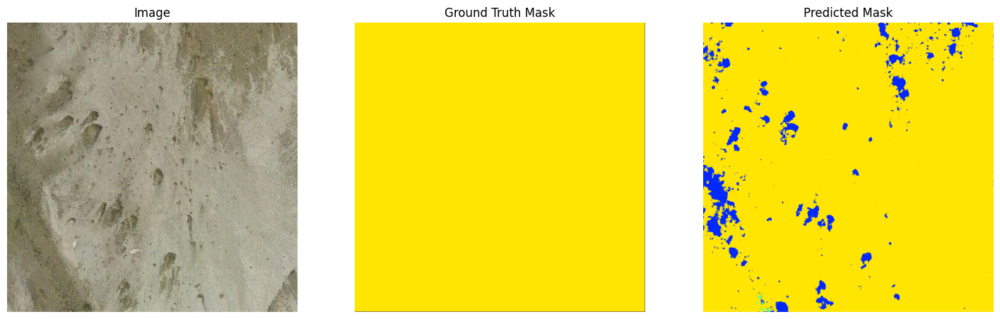

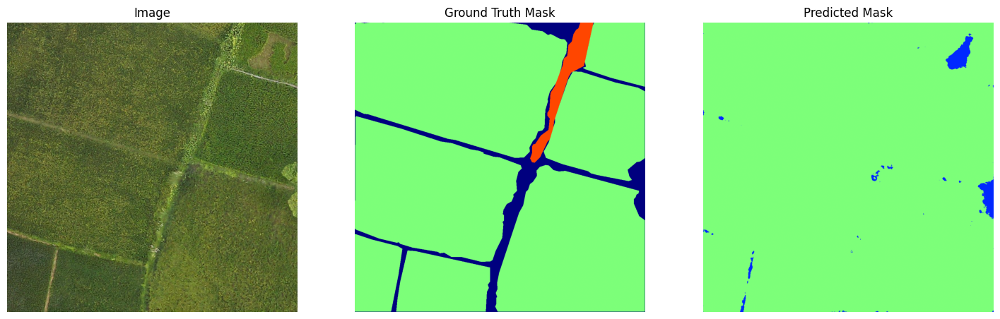

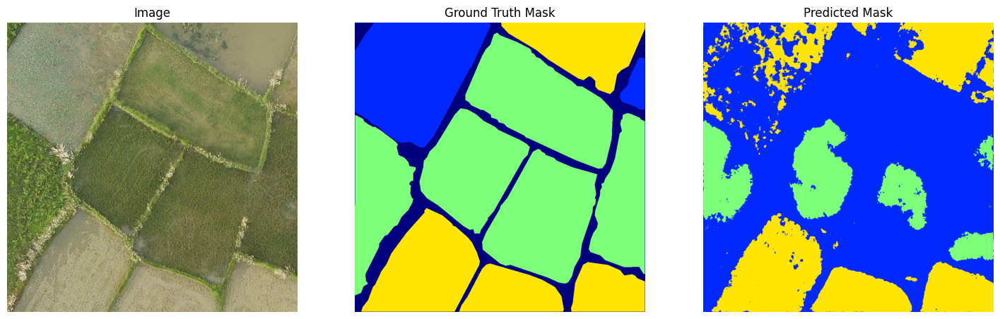

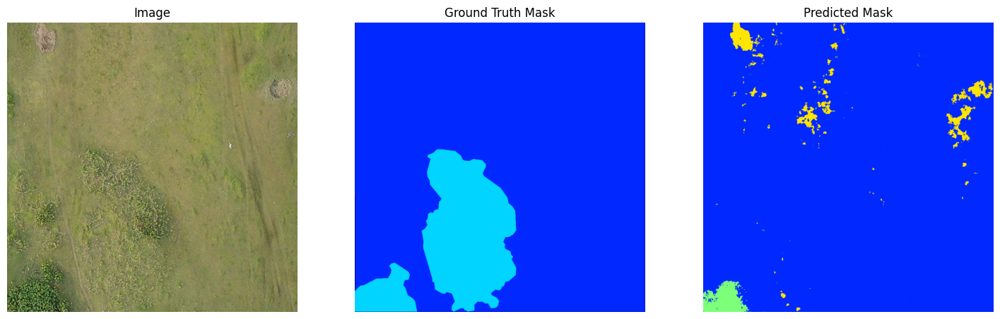

In [28]:
import torch
import numpy as np
import cv2
import os
import random
from torchvision import transforms
import matplotlib.pyplot as plt

# -----------------------------
# 1. Device
# -----------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# 2. Load Model
# -----------------------------
# Replace with your model class
# Example: model = UNET(in_channels=3, out_channels=7)
# model.load_state_dict(torch.load("best_model.pth", map_location=device))
# model.to(device)
# model.eval()

# -----------------------------
# 3. Transform (same as validation)
# -----------------------------
val_transform = transforms.Compose([
    transforms.ToTensor(),  # HWC [0,255] → CHW [0,1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Mask transform
mask_transform = transforms.ToTensor()  # Only converts to tensor

# -----------------------------
# 4. Inference Function
# -----------------------------
def infer(image_path, apply_argmax=True):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Preprocess
    inp = val_transform(img).unsqueeze(0).to(device)   # (1, 3, H, W)

    # Forward Pass
    with torch.no_grad():
        if device == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                out = model(inp)  # (1, num_classes, H, W)
        else:
            out = model(inp)

    # Convert logits → class mask
    if apply_argmax:
        pred_mask = torch.argmax(out, dim=1).squeeze(0).cpu().numpy()
    else:
        pred_mask = out.squeeze(0).cpu().numpy()

    return img, pred_mask

# -----------------------------
# 5. Visualization Function
# -----------------------------
def visualize(img, gt_mask, pred_mask, num_classes=7):
    plt.figure(figsize=(18,6))

    plt.subplot(1,3,1)
    plt.title("Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.title("Ground Truth Mask")
    plt.imshow(gt_mask, cmap="jet", vmin=0, vmax=num_classes-1)
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap="jet", vmin=0, vmax=num_classes-1)
    plt.axis("off")

    plt.show()

# -----------------------------
# 6. Save Model Function
# -----------------------------
def save_model(model, path="best_model.pth"):
    torch.save(model.state_dict(), path)
    print(f"Model saved at {path}")

# -----------------------------
# 7. Inference on Random Images
# -----------------------------
def random_inference(image_folder, mask_folder, num_samples=5):
    image_files = [f for f in os.listdir(image_folder) if f.endswith(".jpg")]
    selected_files = random.sample(image_files, min(num_samples, len(image_files)))

    for file in selected_files:
        img_path = os.path.join(image_folder, file)

        # Correctly generate mask filename
        base_name = os.path.splitext(file)[0]  # removes extension
        mask_name = base_name + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_name)

        # Read GT mask
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if gt_mask is None:
            print(f"Warning: GT mask not found for {file}")
            continue
        gt_mask = gt_mask.astype(np.uint8)

        # Inference
        img, pred_mask = infer(img_path)
        if img is None or pred_mask is None:
            print(f"Warning: Failed to read image or predict for {file}")
            continue

        # Visualize
        visualize(img, gt_mask, pred_mask)



# -----------------------------
# Example Usage
# -----------------------------
# Save the model
# save_model(model, "vgg16_unet_best.pth")

# Random inference
image_folder = "/content/valid/images"
mask_folder = "/content/valid/masks"
random_inference(image_folder, mask_folder, num_samples=4)


In [27]:
save_model(model, "/content/vgg16_unet_best.pth")


Model saved at /content/vgg16_unet_best.pth


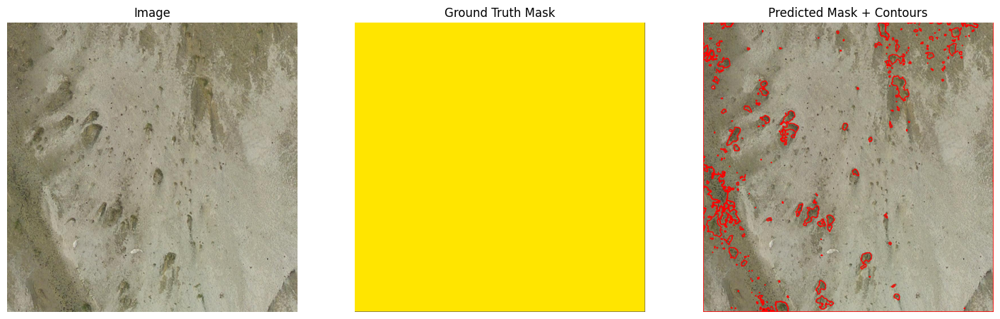

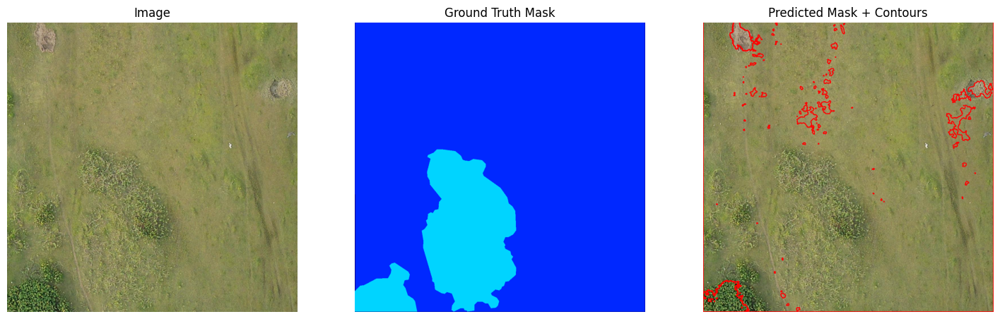

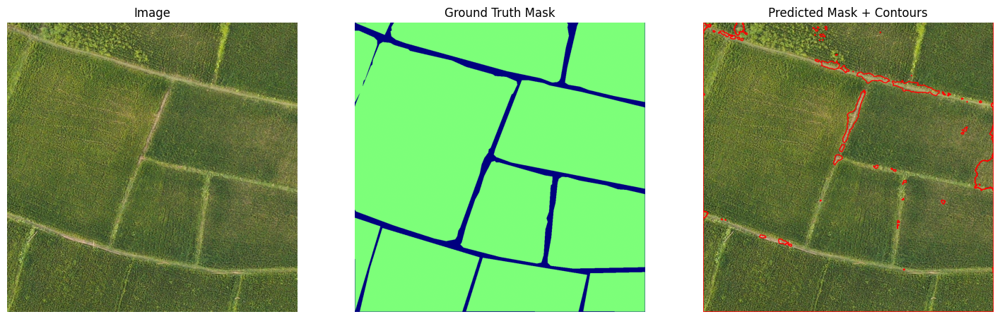

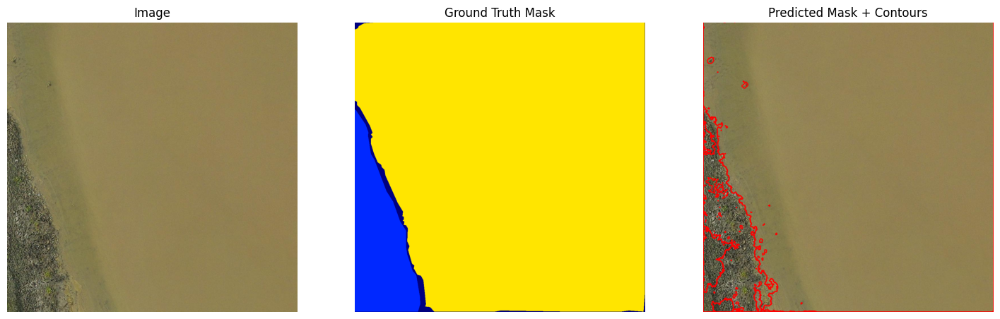

In [30]:
import torch
import numpy as np
import cv2
import os
import random
from torchvision import transforms
import matplotlib.pyplot as plt

# -----------------------------
# 1. Device
# -----------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# 2. Load Model
# -----------------------------
# Replace with your model class
# Example:
# model = UNET(in_channels=3, out_channels=7)
# model.load_state_dict(torch.load("best_model.pth", map_location=device))
# model.to(device)
# model.eval()

# -----------------------------
# 3. Transform (same as validation)
# -----------------------------
val_transform = transforms.Compose([
    transforms.ToTensor(),  # HWC [0,255] → CHW [0,1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Mask transform
mask_transform = transforms.ToTensor()  # Only converts to tensor

# -----------------------------
# 4. Inference Function
# -----------------------------
def infer(image_path, apply_argmax=True):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    inp = val_transform(img).unsqueeze(0).to(device)   # (1, 3, H, W)

    with torch.no_grad():
        if device == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                out = model(inp)
        else:
            out = model(inp)

    if apply_argmax:
        pred_mask = torch.argmax(out, dim=1).squeeze(0).cpu().numpy()
    else:
        pred_mask = out.squeeze(0).cpu().numpy()

    return img, pred_mask

# -----------------------------
# 5. Post-processing Function
# -----------------------------
# -----------------------------
# 5. Post-processing Function for Multi-class Masks
# -----------------------------
def post_process_mask_multiclass(mask, num_classes=7, kernel_size=3):
    """
    Apply morphological operations separately for each class.
    Input:
        mask        : np.array, predicted mask (H,W)
        num_classes : total number of classes
        kernel_size : size of morphological kernel
    Returns:
        processed_mask : np.array, same shape as mask
    """
    processed_mask = np.zeros_like(mask, dtype=np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

    for c in range(num_classes):
        class_mask = (mask == c).astype(np.uint8)  # Binary mask for class c
        class_mask = cv2.morphologyEx(class_mask, cv2.MORPH_OPEN, kernel)
        class_mask = cv2.morphologyEx(class_mask, cv2.MORPH_CLOSE, kernel)
        processed_mask[class_mask == 1] = c

    return processed_mask


# -----------------------------
# 6. Visualization with Contours
# -----------------------------
def visualize_with_contours(img, gt_mask, pred_mask, num_classes=7):
    pred_mask_clean = post_process_mask_multiclass(pred_mask, kernel_size=3)

    overlay = img.copy()
    for cls in range(1, num_classes):  # skip background
        cls_mask = (pred_mask_clean == cls).astype(np.uint8)
        contours, _ = cv2.findContours(cls_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(overlay, contours, -1, color=(255,0,0), thickness=2)  # Blue contours

    plt.figure(figsize=(18,6))

    plt.subplot(1,3,1)
    plt.title("Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.title("Ground Truth Mask")
    plt.imshow(gt_mask, cmap="jet", vmin=0, vmax=num_classes-1)
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.title("Predicted Mask + Contours")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()

# -----------------------------
# 7. Save Model Function
# -----------------------------
def save_model(model, path="best_model.pth"):
    torch.save(model.state_dict(), path)
    print(f"Model saved at {path}")

# -----------------------------
# 8. Random Inference Function
# -----------------------------
def random_inference(image_folder, mask_folder, num_samples=5, num_classes=7):
    image_files = [f for f in os.listdir(image_folder) if f.endswith(".jpg")]
    selected_files = random.sample(image_files, min(num_samples, len(image_files)))

    for file in selected_files:
        img_path = os.path.join(image_folder, file)
        base_name = os.path.splitext(file)[0]
        mask_name = base_name + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_name)

        # Read GT mask
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if gt_mask is None:
            print(f"Warning: GT mask not found for {file}")
            continue
        gt_mask = gt_mask.astype(np.uint8)

        # Inference
        img, pred_mask = infer(img_path)
        if img is None or pred_mask is None:
            print(f"Warning: Failed to read image or predict for {file}")
            continue

        # Visualize with post-processing and contours
        visualize_with_contours(img, gt_mask, pred_mask, num_classes=num_classes)

# -----------------------------
# Example Usage
# -----------------------------
# Save the model
# save_model(model, "vgg16_unet_best.pth")

# Random inference
image_folder = "/content/valid/images"
mask_folder = "/content/valid/masks"
random_inference(image_folder, mask_folder, num_samples=4, num_classes=7)


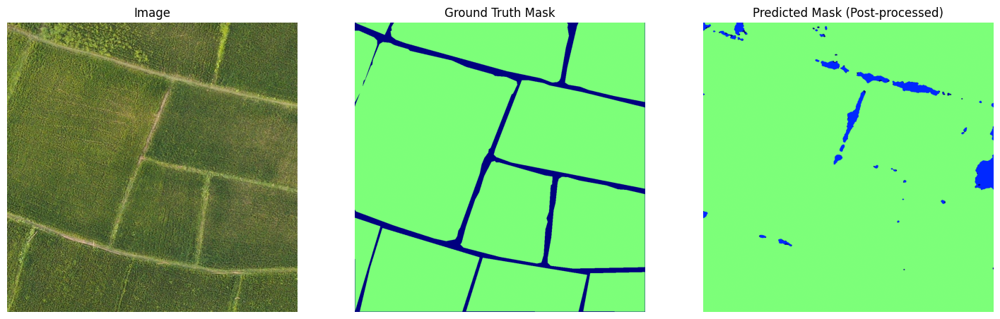

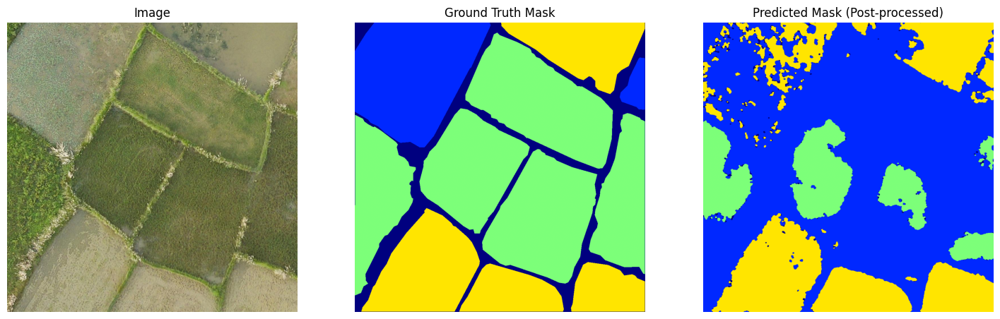

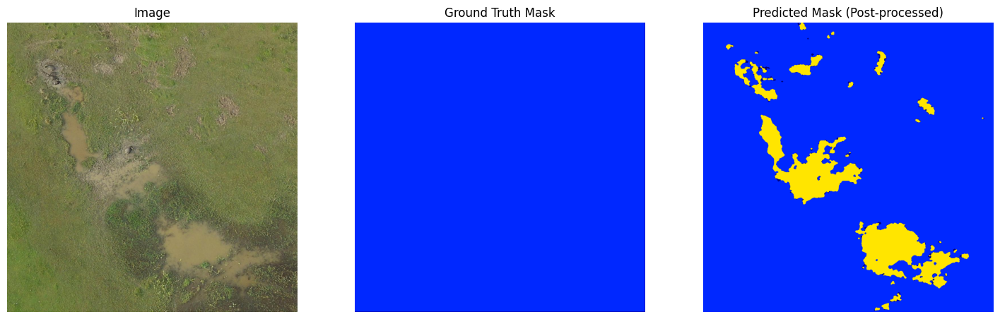

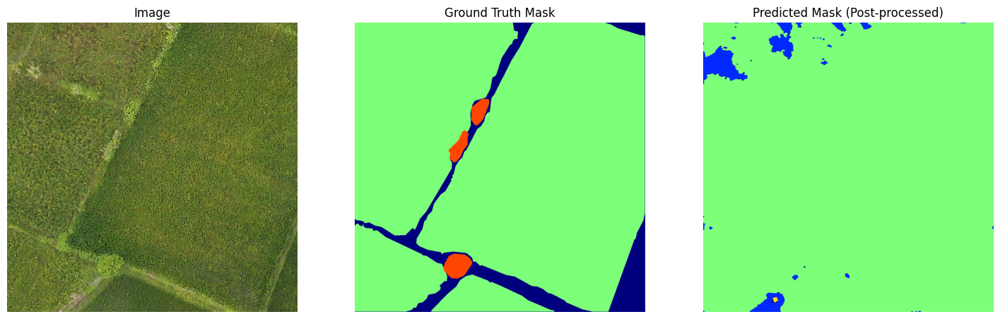

In [31]:
import torch
import numpy as np
import cv2
import os
import random
from torchvision import transforms
import matplotlib.pyplot as plt

# -----------------------------
# 1. Device
# -----------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# 2. Load Model
# -----------------------------
# Example:
# model = UNET(in_channels=3, out_channels=7)
# model.load_state_dict(torch.load("best_model.pth", map_location=device))
# model.to(device)
# model.eval()

# -----------------------------
# 3. Transform (same as validation)
# -----------------------------
val_transform = transforms.Compose([
    transforms.ToTensor(),  # HWC [0,255] → CHW [0,1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# -----------------------------
# 4. Inference Function
# -----------------------------
def infer(image_path, apply_argmax=True):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    inp = val_transform(img).unsqueeze(0).to(device)   # (1, 3, H, W)

    with torch.no_grad():
        if device == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                out = model(inp)
        else:
            out = model(inp)

    if apply_argmax:
        pred_mask = torch.argmax(out, dim=1).squeeze(0).cpu().numpy()
    else:
        pred_mask = out.squeeze(0).cpu().numpy()

    return img, pred_mask

# -----------------------------
# 5. Post-processing Function (Morphological)
# -----------------------------
def post_process_mask_multiclass(mask, num_classes=7, kernel_size=3):
    """
    Apply morphological operations per class to clean the mask.
    """
    processed_mask = np.zeros_like(mask, dtype=np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

    for c in range(num_classes):
        class_mask = (mask == c).astype(np.uint8)
        class_mask = cv2.morphologyEx(class_mask, cv2.MORPH_OPEN, kernel)
        class_mask = cv2.morphologyEx(class_mask, cv2.MORPH_CLOSE, kernel)
        processed_mask[class_mask == 1] = c

    return processed_mask

# -----------------------------
# 6. Visualization Function
# -----------------------------
def visualize(img, gt_mask, pred_mask, num_classes=7):
    plt.figure(figsize=(18,6))

    plt.subplot(1,3,1)
    plt.title("Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.title("Ground Truth Mask")
    plt.imshow(gt_mask, cmap="jet", vmin=0, vmax=num_classes-1)
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.title("Predicted Mask (Post-processed)")
    plt.imshow(pred_mask, cmap="jet", vmin=0, vmax=num_classes-1)
    plt.axis("off")

    plt.show()

# -----------------------------
# 7. Save Model Function
# -----------------------------
# def save_model(model, path="best_model.pth"):
#     torch.save(model.state_dict(), path)
#     print(f"Model saved at {path}")

# -----------------------------
# 8. Random Inference Function
# -----------------------------
def random_inference(image_folder, mask_folder, num_samples=5, num_classes=7, kernel_size=3):
    image_files = [f for f in os.listdir(image_folder) if f.endswith(".jpg")]
    selected_files = random.sample(image_files, min(num_samples, len(image_files)))

    for file in selected_files:
        img_path = os.path.join(image_folder, file)
        base_name = os.path.splitext(file)[0]
        mask_name = base_name + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_name)

        # Read GT mask
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if gt_mask is None:
            print(f"Warning: GT mask not found for {file}")
            continue
        gt_mask = gt_mask.astype(np.uint8)

        # Inference
        img, pred_mask = infer(img_path)
        if img is None or pred_mask is None:
            print(f"Warning: Failed to read image or predict for {file}")
            continue

        # Post-process mask
        pred_mask = post_process_mask_multiclass(pred_mask, num_classes=num_classes, kernel_size=kernel_size)

        # Visualize
        visualize(img, gt_mask, pred_mask, num_classes=num_classes)

# -----------------------------
# Example Usage
# -----------------------------
# Save model
# save_model(model, "vgg16_unet_best.pth")

# Random inference with post-processed masks
image_folder = "/content/valid/images"
mask_folder = "/content/valid/masks"
random_inference(image_folder, mask_folder, num_samples=4, num_classes=7, kernel_size=5)
